In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
# #         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

**DATA PREPROCESSING**

In [2]:
train_dir = "/kaggle/input/hhhhhhhh/data_/output/"
test_dir = "/kaggle/input/hhhhhhhh/data_/test/"

In [11]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=2) # stop

In [3]:
# Create data inputs
import tensorflow as tf
IMG_SIZE = (224, 224) # define image size
train_data = tf.keras.preprocessing.image_dataset_from_directory(directory=train_dir,
                                                                            image_size=IMG_SIZE,
                                                                            label_mode="categorical", # what type are the labels?
                                                                            batch_size=32) # batch_size is 32 by default, this is generally a good number
test_data = tf.keras.preprocessing.image_dataset_from_directory(directory=test_dir,
                                                                           image_size=IMG_SIZE,
                                                                           label_mode="categorical")

2024-04-19 22:26:18.047207: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-19 22:26:18.047324: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-19 22:26:18.320256: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Found 49389 files belonging to 2 classes.
Found 12346 files belonging to 2 classes.


In [4]:
classes=train_data.class_names

In [5]:
classes

['abnormal', 'normal']

In [6]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 50 #@param {type:"slider", min:10, max:100, step:10}

In [7]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
# from tensorflow.keras.layers.experimental import preprocessing

# NEW: Newer versions of TensorFlow (2.10+) can use the tensorflow.keras.layers API directly for data augmentation
data_augmentation = keras.Sequential([
  layers.RandomFlip("horizontal"),
  layers.RandomRotation(0.2),
  layers.RandomZoom(0.2),
  layers.RandomHeight(0.2),
  layers.RandomWidth(0.2),
  # preprocessing.Rescaling(1./255) # keep for ResNet50V2, remove for EfficientNetV2B0
], name ="data_augmentation")

In [8]:
from tensorflow.keras import layers
from tensorflow.keras import regularizers
import tensorflow as tf

# Create base model
input_shape = (224, 224, 3)
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
base_model.trainable = False  # freeze base model layers

# Create Functional model
inputs = layers.Input(shape=input_shape, name="input_layer")
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D(name="pooling_layer")(x)

# Add L2 regularization to the Dense layer
x = layers.Dense(2, kernel_regularizer=regularizers.l2(0.001))(x)

# Separate activation of output layer so we can output float32 activations
outputs = layers.Activation("sigmoid", dtype=tf.float32, name="output")(x)
model = tf.keras.Model(inputs, outputs)

# Compile the model
model.compile(
    loss="binary_crossentropy",  # Use binary crossentropy for binary classification
    optimizer=tf.keras.optimizers.Adam(),
    metrics=["accuracy"]
)


24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [9]:
# Make the creating of our model a little easier
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras import Sequential

In [12]:
# Train the model
model.fit(train_data, epochs=5
          , validation_data=test_data,callbacks=[ early_stopping])

Epoch 1/5
   3/1544 ━━━━━━━━━━━━━━━━━━━━ 1:27 57ms/step - accuracy: 0.3594 - loss: 0.7687  

I0000 00:00:1713565830.359548      92 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1713565830.421863      92 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


1544/1544 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8450 - loss: 0.3808

W0000 00:00:1713565945.669137      94 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1713565952.401244      94 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


1544/1544 ━━━━━━━━━━━━━━━━━━━━ 202s 102ms/step - accuracy: 0.8450 - loss: 0.3808 - val_accuracy: 0.8756 - val_loss: 0.3063
Epoch 2/5


W0000 00:00:1713565987.514701      94 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


1544/1544 ━━━━━━━━━━━━━━━━━━━━ 71s 46ms/step - accuracy: 0.8717 - loss: 0.3097 - val_accuracy: 0.8830 - val_loss: 0.2889
Epoch 3/5
1544/1544 ━━━━━━━━━━━━━━━━━━━━ 71s 46ms/step - accuracy: 0.8807 - loss: 0.2975 - val_accuracy: 0.8855 - val_loss: 0.2841
Epoch 4/5
1544/1544 ━━━━━━━━━━━━━━━━━━━━ 69s 44ms/step - accuracy: 0.8847 - loss: 0.2950 - val_accuracy: 0.8849 - val_loss: 0.2839
Epoch 5/5
1544/1544 ━━━━━━━━━━━━━━━━━━━━ 70s 45ms/step - accuracy: 0.8877 - loss: 0.2931 - val_accuracy: 0.8938 - val_loss: 0.2800


In [16]:
test_loss, test_accuracy = model.evaluate(test_data)

# Predict on test data
predictions = model.predict(test_data)

386/386 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.8957 - loss: 0.2776
386/386 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step


In [22]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Get true labels
true_labels = []
for images, labels in test_data:
    true_labels.extend(tf.argmax(labels, axis=1).numpy())

# Convert probabilities to binary predictions
binary_predictions = (predictions > 0.5).astype(int)

# Flatten the predictions if needed
binary_predictions = binary_predictions.argmax(axis=1)

# Calculate accuracy
accuracy = accuracy_score(true_labels, binary_predictions)

# Calculate precision
precision = precision_score(true_labels, binary_predictions)

# Calculate recall
recall = recall_score(true_labels, binary_predictions)

# Calculate F1 score
f1 = f1_score(true_labels, binary_predictions)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


Accuracy: 0.7827636481451482
Precision: 0.8363042710907166
Recall: 0.9197399068322981
F1 Score: 0.8760399334442597


In [ ]:
/kaggle/input/dcsass-dataset/DCSASS Dataset/Shoplifting/Shoplifting001_x264.mp4/Shoplifting001_x264_0.mp4

Button(description='Stop', style=ButtonStyle())

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


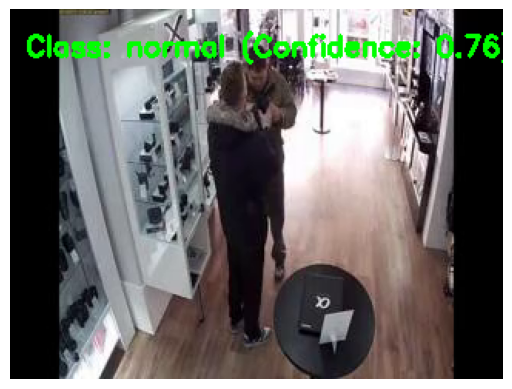

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


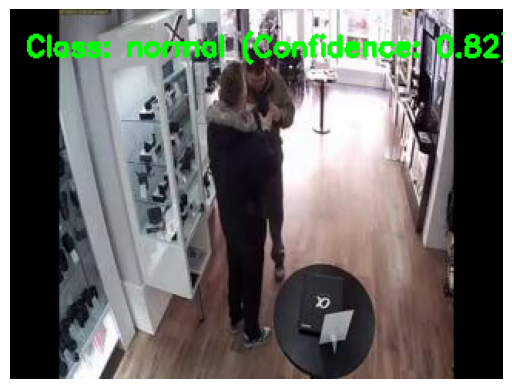

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


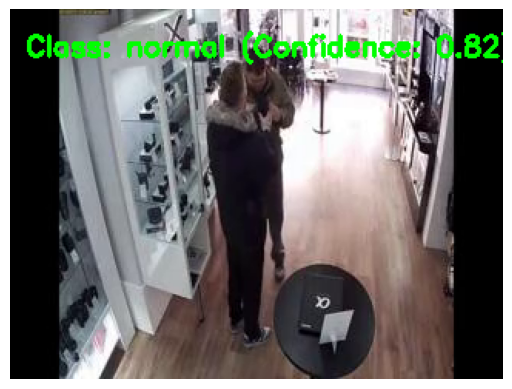

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


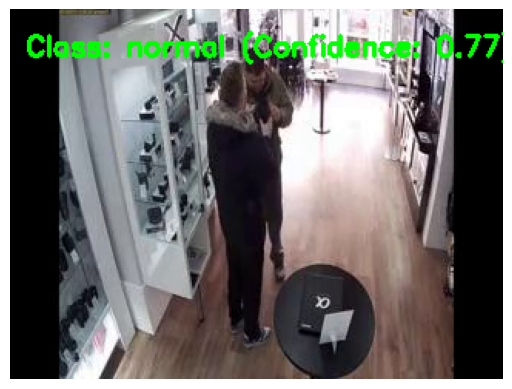

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


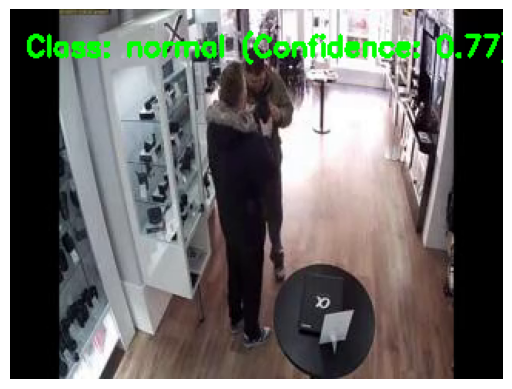

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


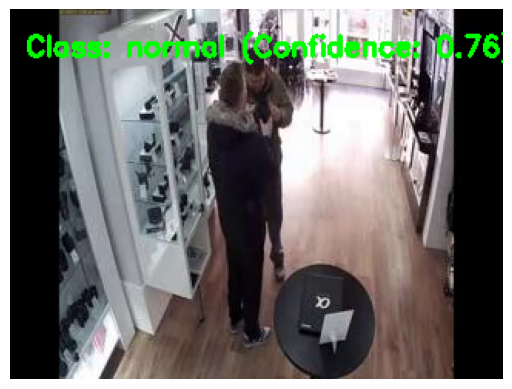

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


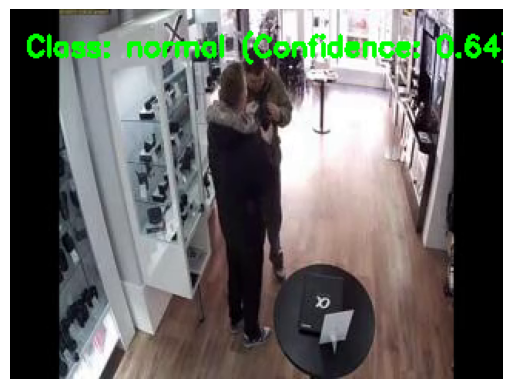

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


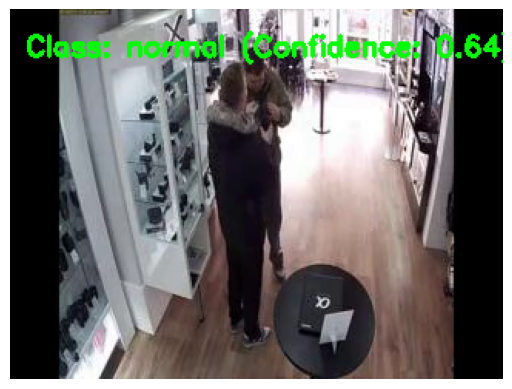

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


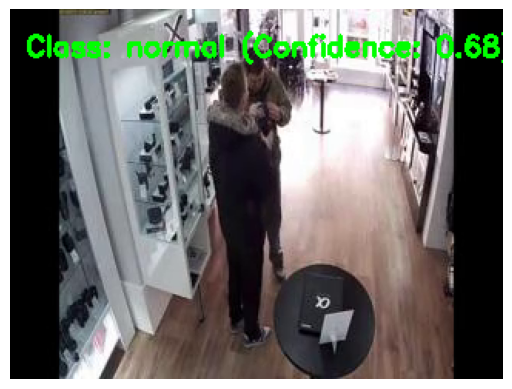

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


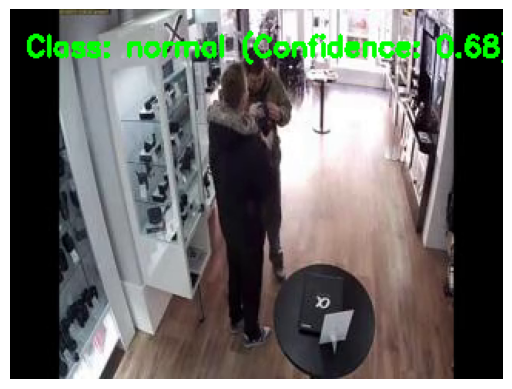

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


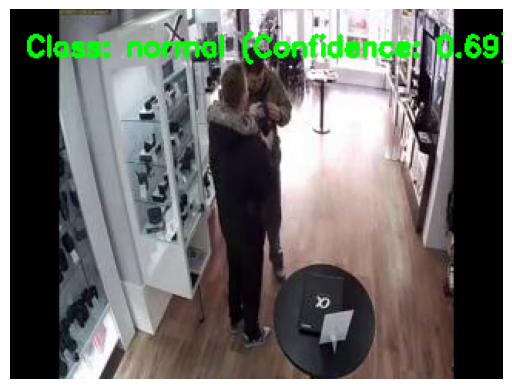

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


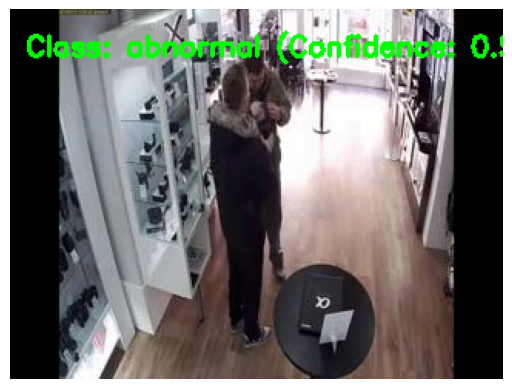

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


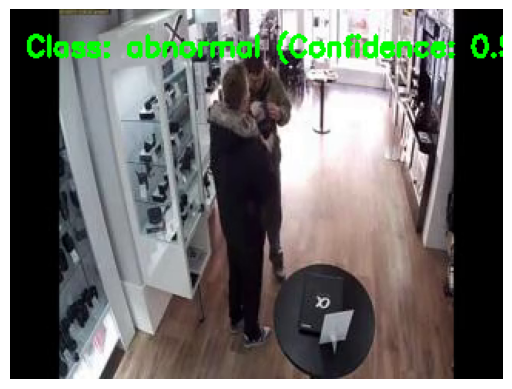

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


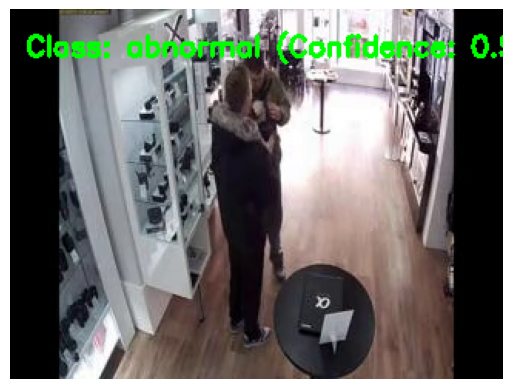

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


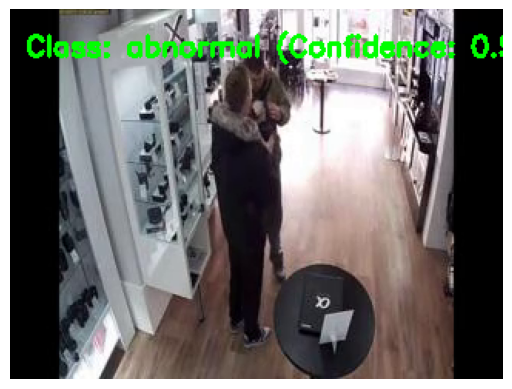

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


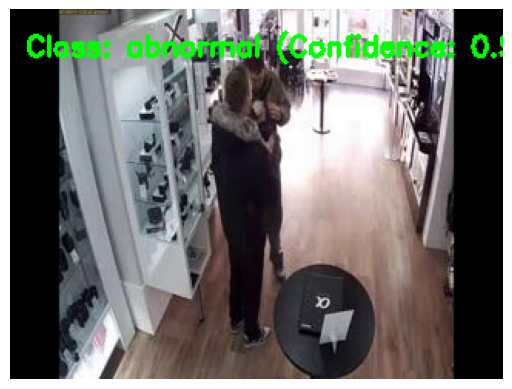

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


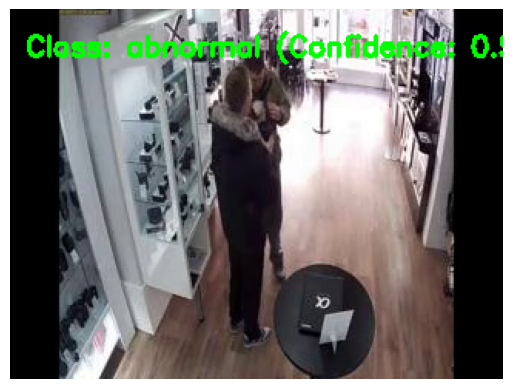

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


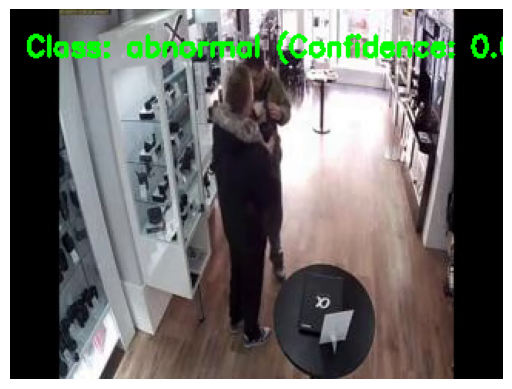

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


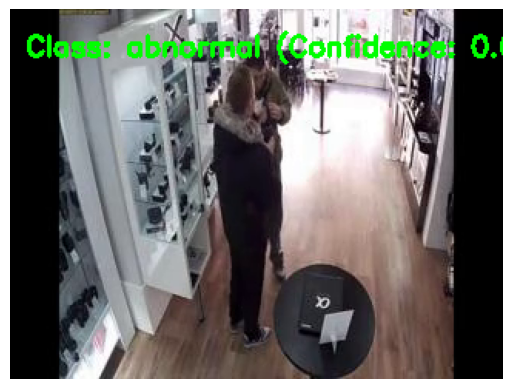

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


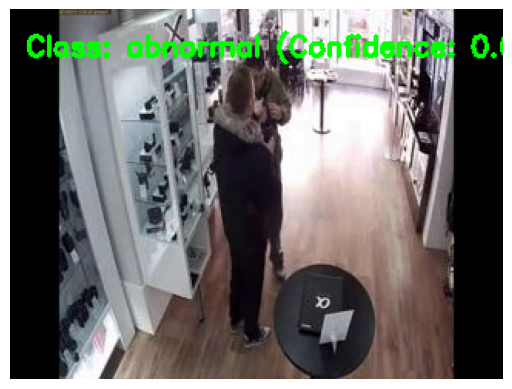

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


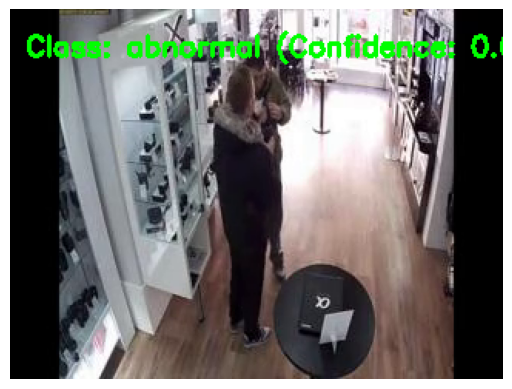

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


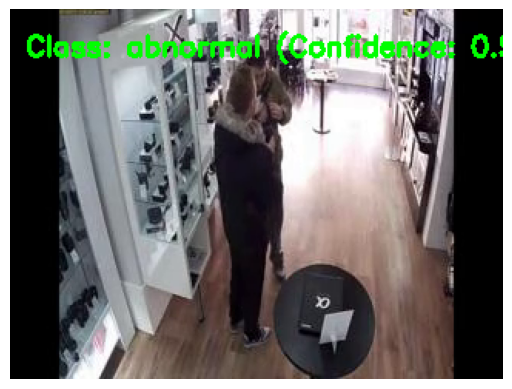

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


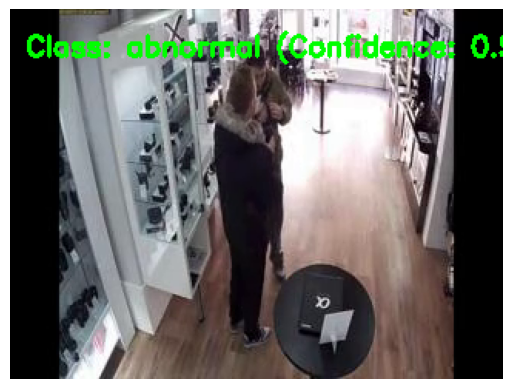

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


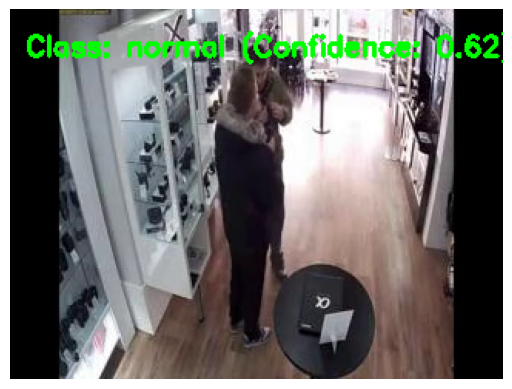

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


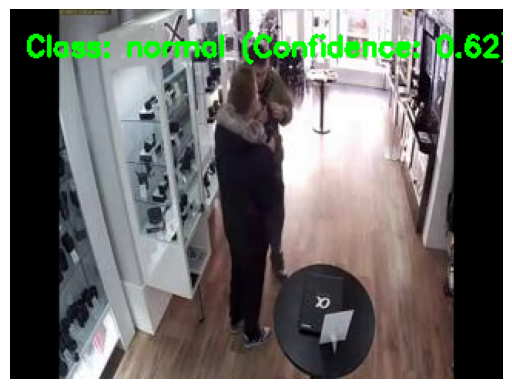

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


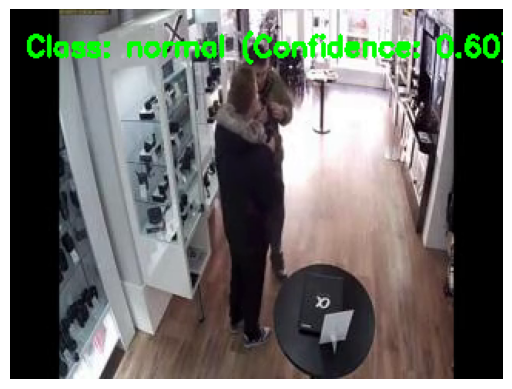

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


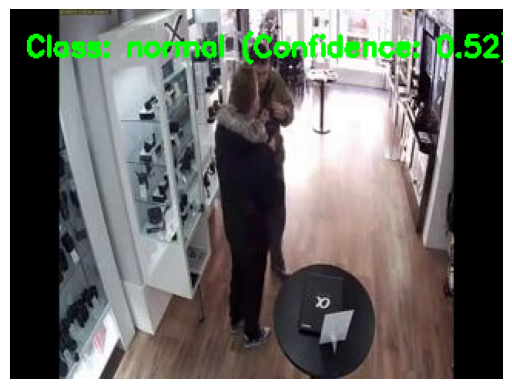

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


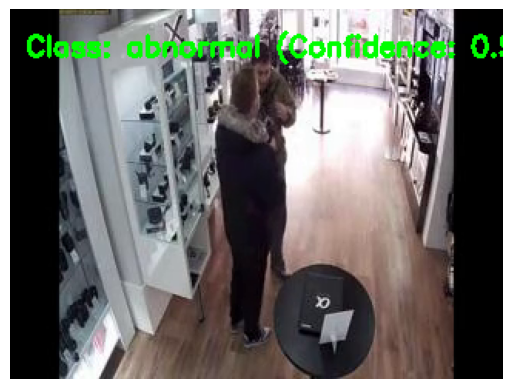

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


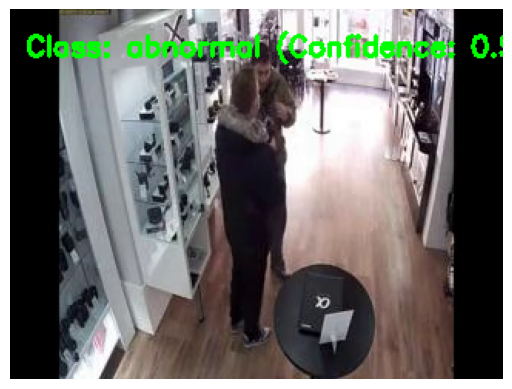

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


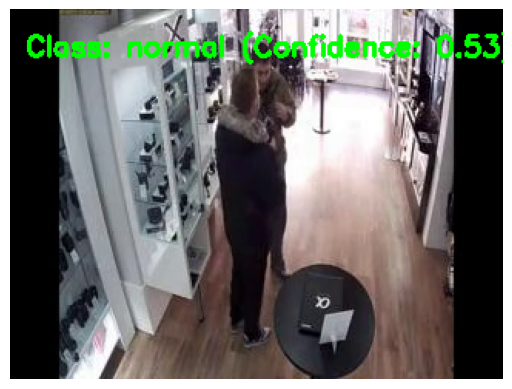

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


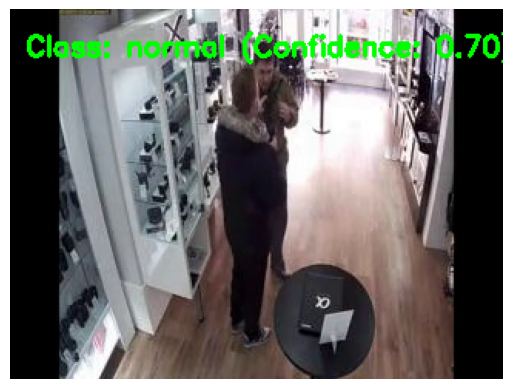

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


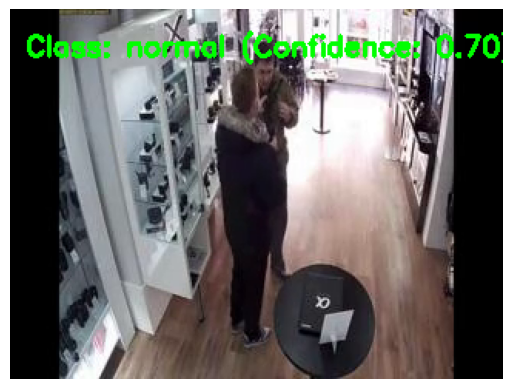

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


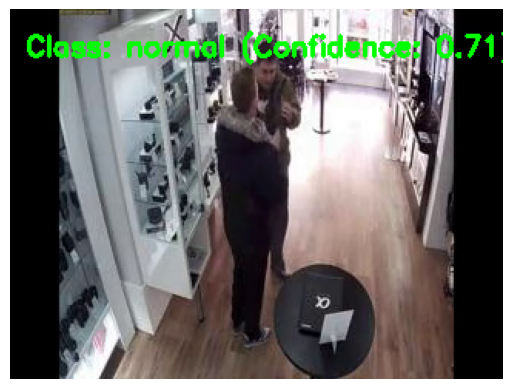

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


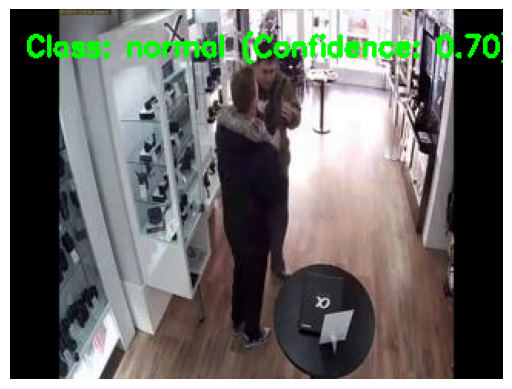

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


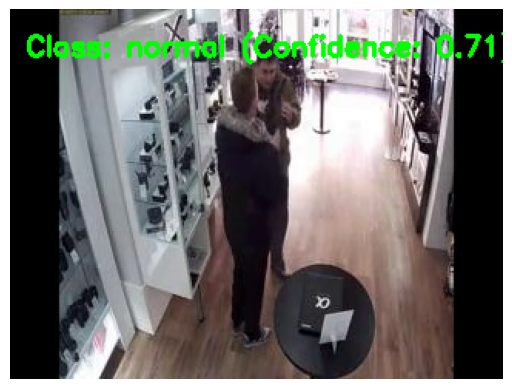

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


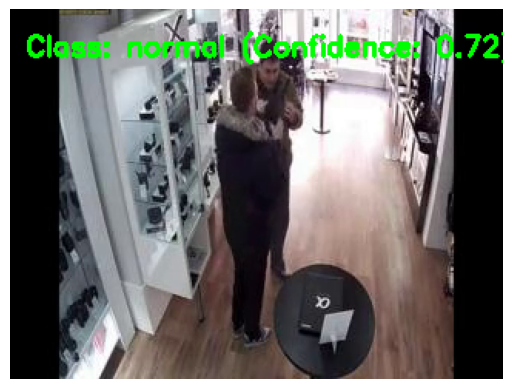

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


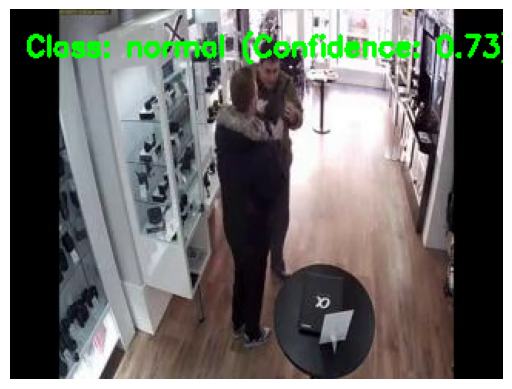

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


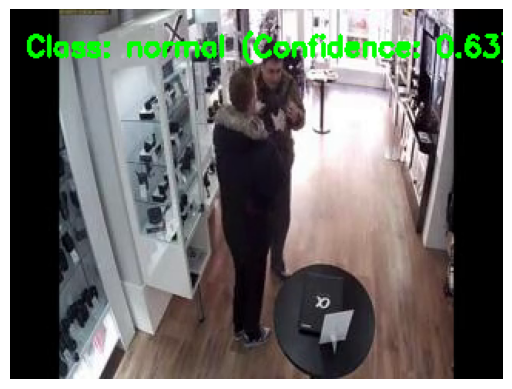

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


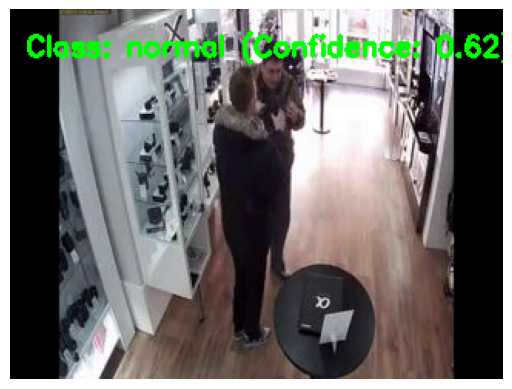

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


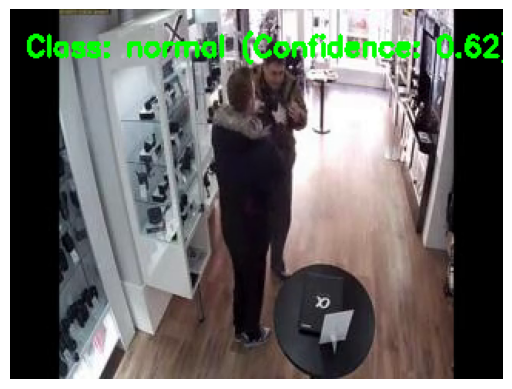

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


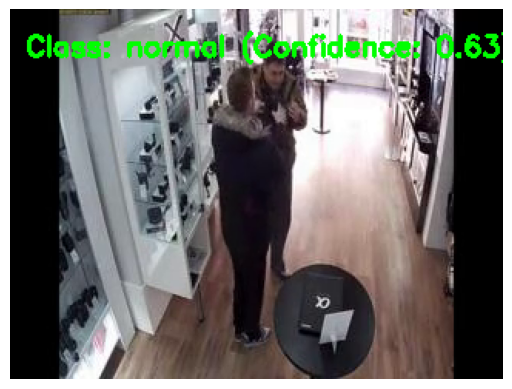

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


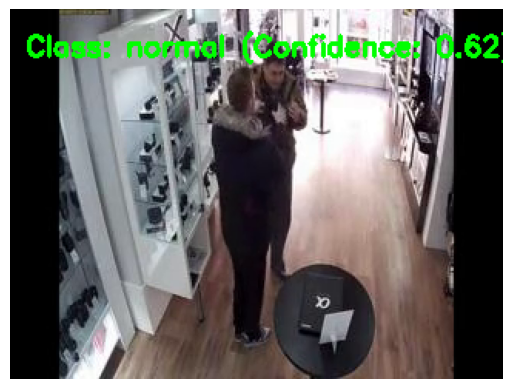

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


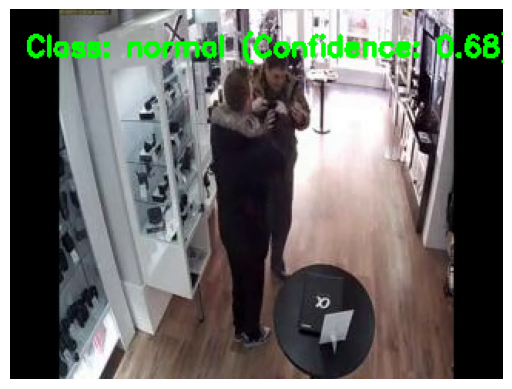

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


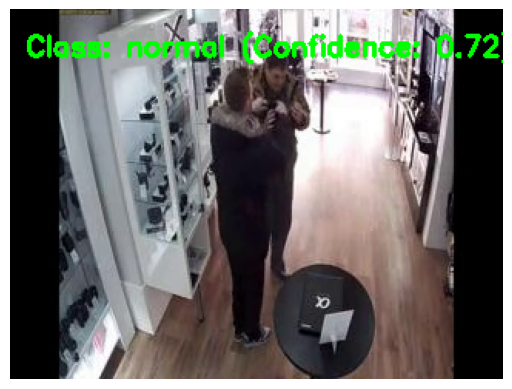

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


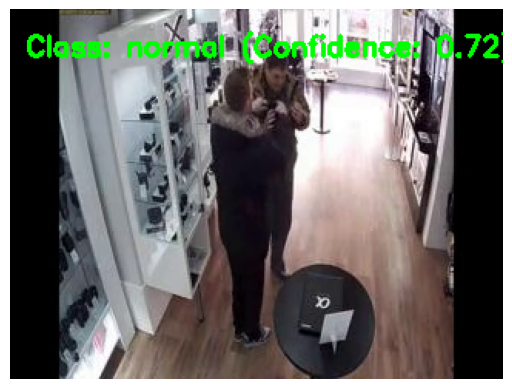

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


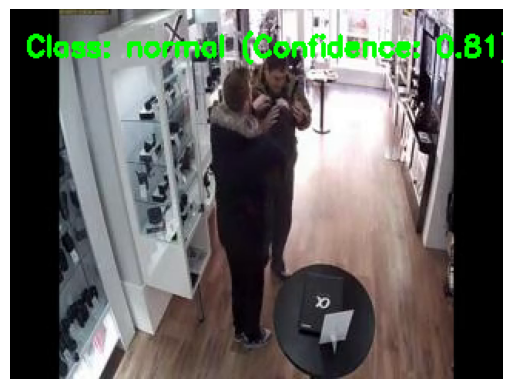

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


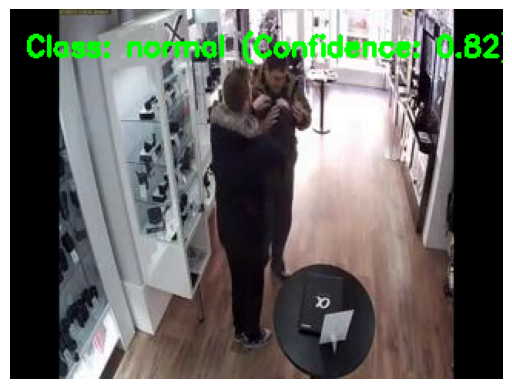

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


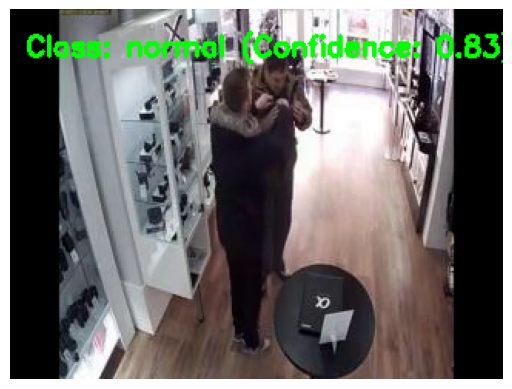

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


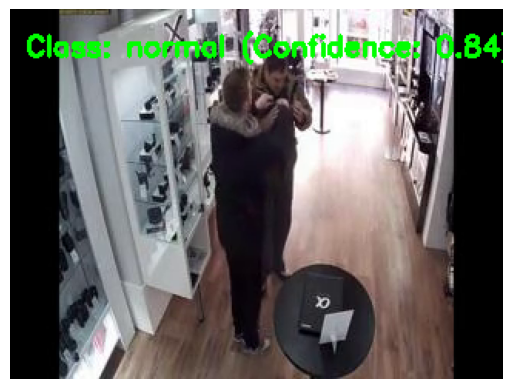

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


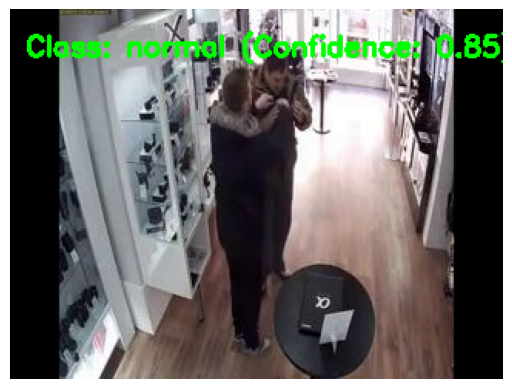

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


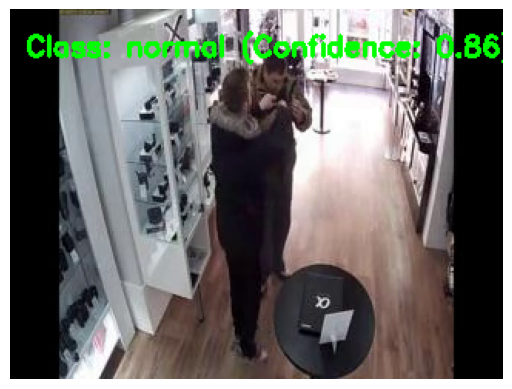

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


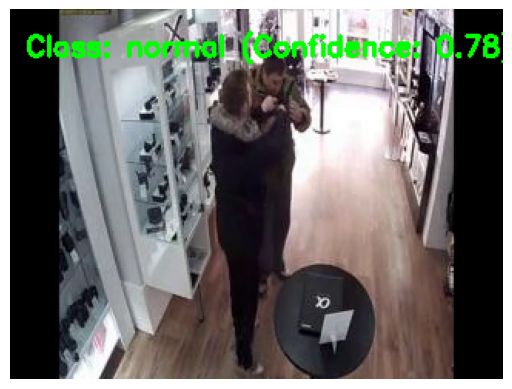

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


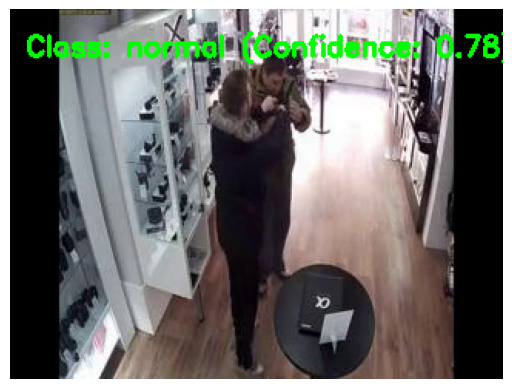

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


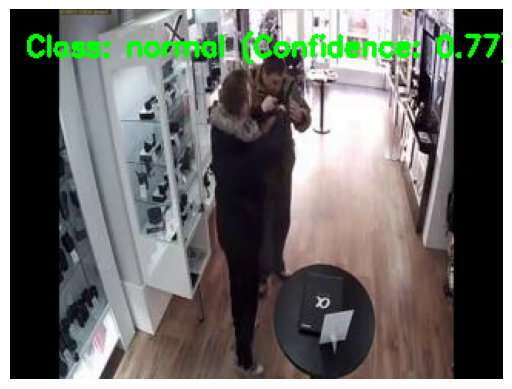

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


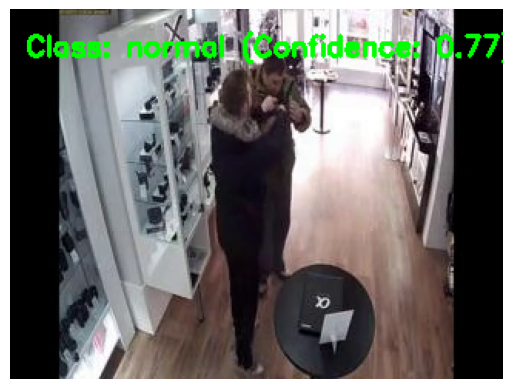

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


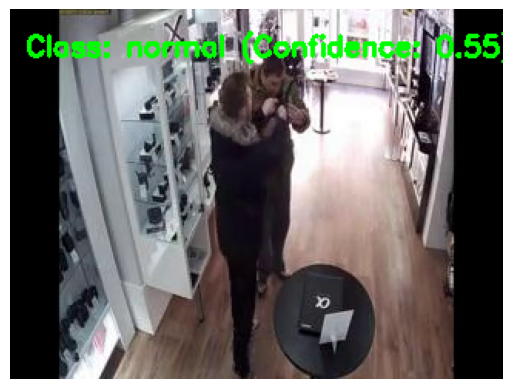

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


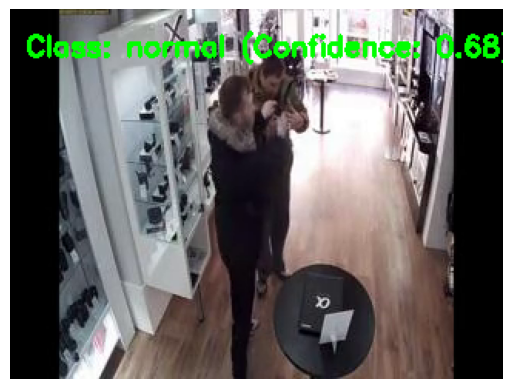

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


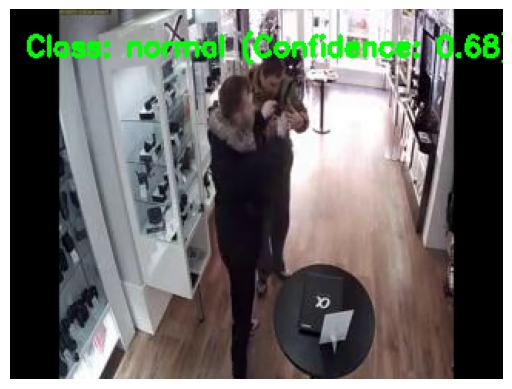

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


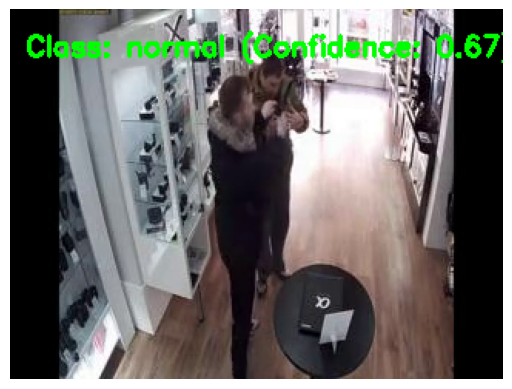

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


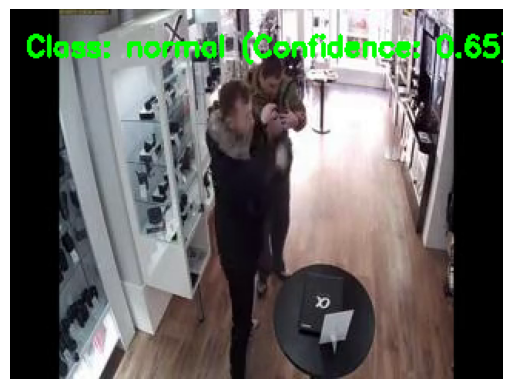

In [50]:
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.efficientnet import preprocess_input
import matplotlib.pyplot as plt
from IPython.display import display
import ipywidgets as widgets

# Load the Keras model
# model = load_model('../input/your_model_directory/my_model.keras')  # Update with your model path

# Define your classes
classes = ['abnormal', 'normal']

# Function to preprocess the image for EfficientNetB0
def preprocess_image(img):
    img = tf.convert_to_tensor(img, dtype=tf.float32)
    img = tf.image.resize(img, [224, 224])
    img = np.expand_dims(img, axis=0)
    # img = preprocess_input(img)  # If needed
    return img

# Function to perform classification and overlay results on the frame
def classify_frame(frame):
    # Preprocess the frame
    processed_frame = preprocess_image(frame)

    # Make prediction
    predictions = model.predict(processed_frame)

    # Get the index of the predicted class
    predicted_class_index = np.argmax(predictions[0])

    # Get the class label
    predicted_class = classes[predicted_class_index]

    # Get the confidence score
    confidence = predictions[0][predicted_class_index]

    # Overlay predictions on the frame
    label_text = f"Class: {predicted_class} (Confidence: {confidence:.2f})"
    cv2.putText(frame, label_text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    return frame

# Path to the video file (update with your file path)
video_path = '/kaggle/input/dcsass-dataset/DCSASS Dataset/Shoplifting/Shoplifting005_x264.mp4/Shoplifting005_x264_13.mp4'  # Update with your video path

# Open the video file
cap = cv2.VideoCapture(video_path)

# Define a flag for breaking the loop
stop_button = widgets.Button(description='Stop')
display(stop_button)

def stop_callback(button):
    cap.release()

stop_button.on_click(stop_callback)

while cap.isOpened():
    # Read a frame from the video
    ret, frame = cap.read()

    # Break the loop if the video is finished
    if not ret:
        break

    # Classify the frame
    classified_frame = classify_frame(frame)

    # Convert the frame from BGR to RGB
    classified_frame_rgb = cv2.cvtColor(classified_frame, cv2.COLOR_BGR2RGB)

    # Display the frame using Matplotlib
    plt.imshow(classified_frame_rgb)
    plt.axis('off')
    plt.show()
